<a href="https://colab.research.google.com/github/jvataidee/pdi_python/blob/main/classificacao_supervisionada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Modelo Classificação Supervisionada

### Instalar e IMportar Bibliotecas

In [55]:
!pip install spectral
!pip install rasterio

In [56]:
# Bibliotecas de GIS
from osgeo import gdal
from osgeo import ogr

In [92]:
# Outras bibliotecas
import pandas as pd
from spectral import *
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio as rio
from rasterio.plot import reshape_as_raster
import numpy as np

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

## Rasterização  

In [58]:
# Leitura somente da banda 1
raster = gdal.Open('/content/drive/MyDrive/pdi_python/21 - PDI com Python/01 - Pré-Processamento/imagens/L71221071_07120010720_DN_B1.tif')

#Leitura da área de interesse
vetor = ogr.Open('/content/drive/MyDrive/pdi_python/21 - PDI com Python/03 - Classificações Temáticas/ROI.shp')

In [59]:
# Get layer
layer = vetor.GetLayer()

In [60]:
# Armazenando parâmetros cartográficos
transform = raster.GetGeoTransform()
transform

(160665.0, 30.0, 0.0, 8279275.0, 0.0, -30.0)

In [61]:
# Criando o raster
driver = gdal.GetDriverByName('GTiff')
raster_roi = driver.Create('roi.tif',raster .RasterXSize, raster .RasterYSize, 1, gdal.GDT_Int16)
raster_roi.SetGeoTransform(transform)

0

In [62]:
# Colocando informação do raster com o vetor
gdal.RasterizeLayer(raster_roi, [1], layer, options=['ATTRIBUTE=id'])
raster_roi.GetRasterBand(1).SetNoDataValue(0.0)
raster_roi = None

## Treinando modelo Nearest Neighbors

In [63]:
# Lendo imagem como array
src = rio.open('/content/drive/MyDrive/pdi_python/21 - PDI com Python/01 - Pré-Processamento/L71221071_07120010720_DN.tif')
b1 = src.read(1)
b2 = src.read(2)
b3 = src.read(3)
b4 = src.read(4)
b5 = src.read(5)
b7 = src.read(6)

img = np.dstack([b1,b2,b3,b4,b5,b7])

In [64]:
# Armazenando metadados
meta = src.profile

In [65]:
# Lendo classes
with rio.open('/content/roi.tif') as src2:
  gt = src2.read(1)

/usr/local/lib/python3.10/dist-packages/spectral/graphics/spypylab.py:796: UserWarning: Failed to create RectangleSelector object. Interactive pixel class labeling will be unavailable.
  warnings.warn(msg)


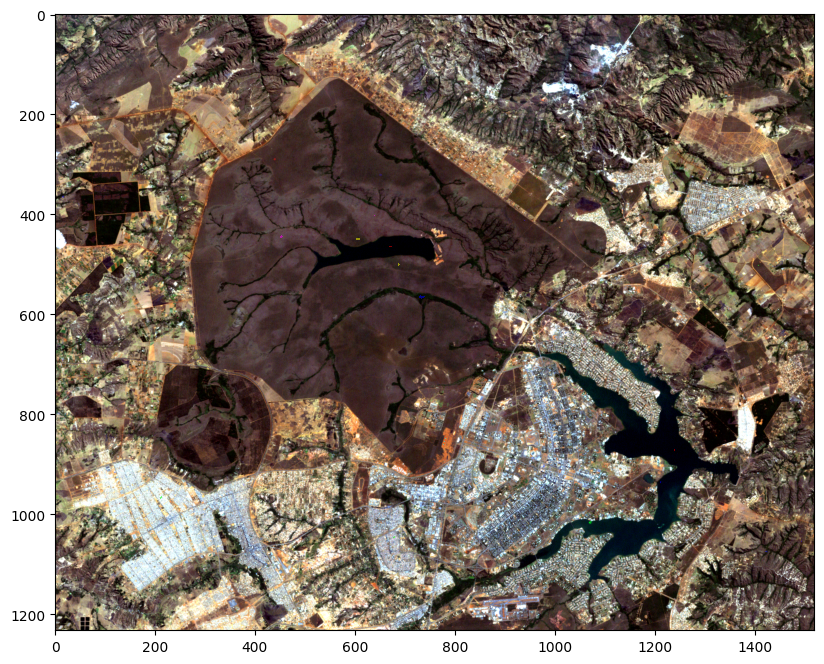

In [66]:
view = imshow(img, (2,1,0), classes=gt, stretch=(0.02,0.98), figsize=(12,8))
view.set_display_mode('overlay')

In [36]:
# Criar classes de treinamento para o classificador Gaussiano usando a imagem e os dados de referência
classes_gaussian = create_training_classes(img, gt)

# Criar uma instância do classificador Gaussiano com as classes de treinamento e um tamanho mínimo de amostra de 20
gmlc = GaussianClassifier(classes_gaussian, min_samples=20)

# Classificar a imagem usando o classificador Gaussiano
clmap = gmlc.classify_image(img)

Processing...  0.0%Processing... 16.7%Processing... 33.3%Processing... 50.0%Processing... 66.7%Processing... 83.3%Processing... 100.0%Processing...done   


ImageView object:
  Interpolation       :  <default>

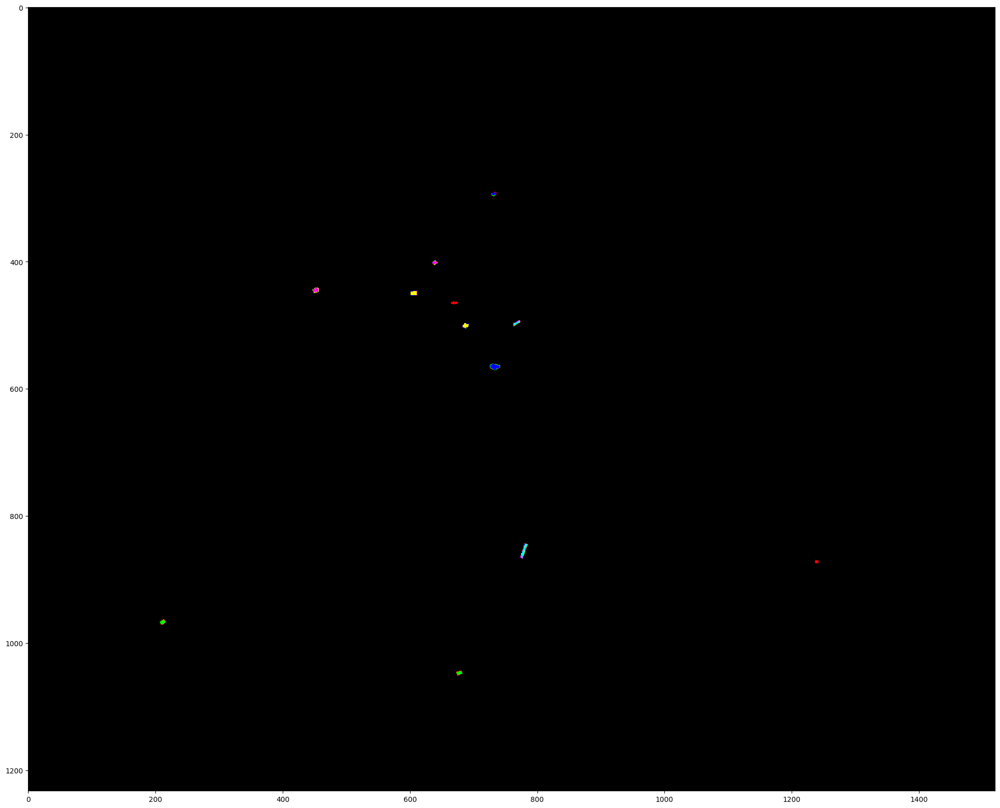

In [37]:
# Visualizando erro no treinamento
clmap_error = clmap * (gt != 0)
imshow(classes=clmap_error, figsize=(30,20))

ImageView object:
  Interpolation       :  <default>

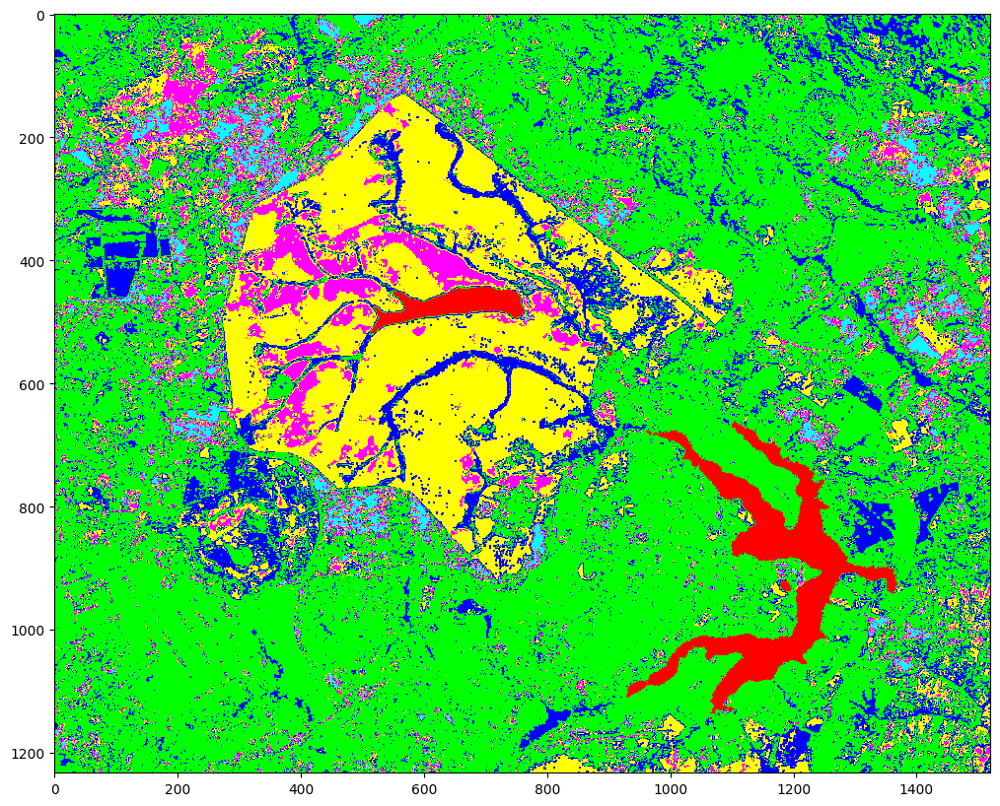

In [38]:
# Visualizando
imshow(classes=clmap, figsize=(20,10))

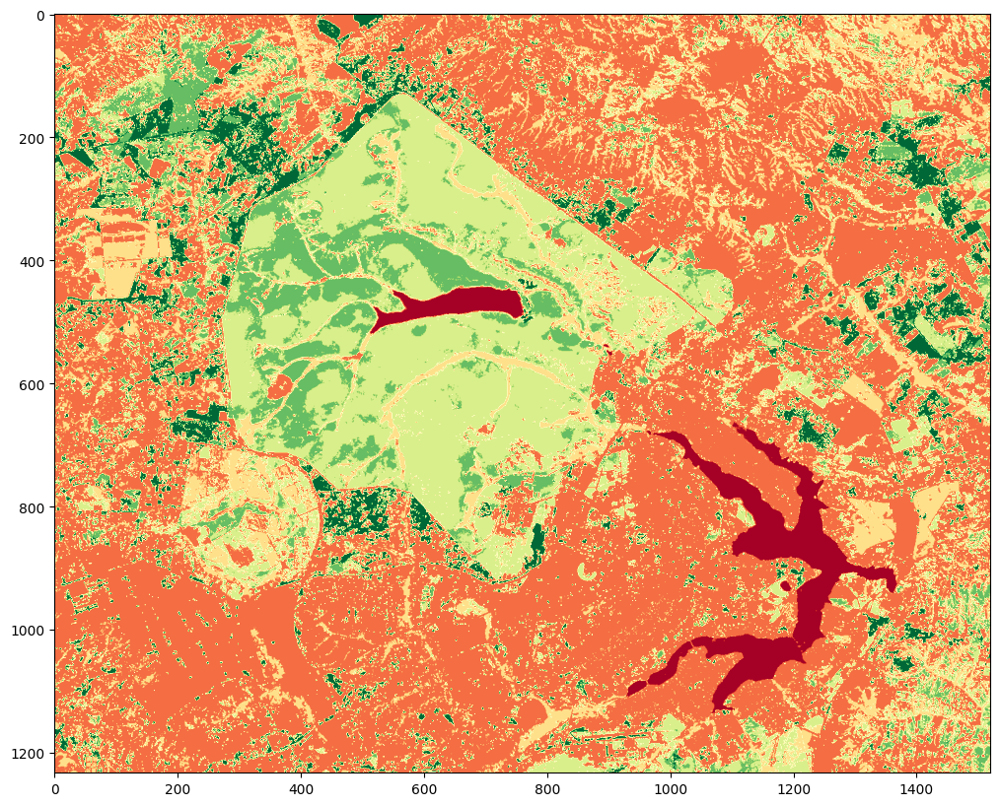

In [40]:
plt.figure(figsize=(20,10))
plt.imshow(clmap, cmap='RdYlGn')
plt.show()

In [41]:
# Gravando metada dado
meta.update({'count': 1})

In [42]:
# Salvar resultado
with rio.open('glmc.tif', 'w', **meta) as src:
  src.write(clmap,1)

## Treinando modelo  Multi-Layer Perceptron
[Multi-Layer Perceptron](https://en.wikipedia.org/wiki/Multilayer_perceptron)

In [43]:
# Criando modelo
classes_mlp = create_training_classes(img,gt)

inputs = img.shape[2]
outputs = len(classes_mlp)

In [46]:
# Criar uma instância do classificador perceptron com as classes de treinamento e um tamanho mínimo de amostra de 20
p = PerceptronClassifier([inputs, 20,10, outputs])

# Treinar modelo
p.train(classes_mlp, 20, clip=0., accuracy=100, batch=5, momentum=0.3, rate=0.5)

# Classificar a imagem usando o classificador Gaussiano
c = p.classify(img)


Iter     0: Accuracy = 8.33% E = 56.545844

Iter     1: Accuracy = 0.00% E = 52.381877

Iter     2: Accuracy = 0.00% E = 52.242649

Iter     3: Accuracy = 0.00% E = 52.133450

Iter     4: Accuracy = 0.00% E = 52.016211

Iter     5: Accuracy = 0.00% E = 51.889375

Iter     6: Accuracy = 0.00% E = 51.751650

Iter     7: Accuracy = 0.00% E = 51.600375

Iter     8: Accuracy = 0.00% E = 51.431538

Iter     9: Accuracy = 0.00% E = 51.239655

Iter    10: Accuracy = 0.00% E = 51.017455

Iter    11: Accuracy = 0.00% E = 50.755438

Iter    12: Accuracy = 0.00% E = 50.441446

Iter    13: Accuracy = 0.00% E = 50.060492

Iter    14: Accuracy = 0.00% E = 49.595421

Iter    15: Accuracy = 0.00% E = 49.029424

Iter    16: Accuracy = 0.00% E = 48.351440

Iter    17: Accuracy = 0.00% E = 47.564021

Iter    18: Accuracy = 2.50% E = 46.689763

Iter    19: Accuracy = 3.33% E = 45.770645

Iter    20: Accuracy = 4.17% E = 44.858576

Iter    21: Accuracy = 10.00% E = 44.001093

Iter    22: Accuracy = 10.83% 

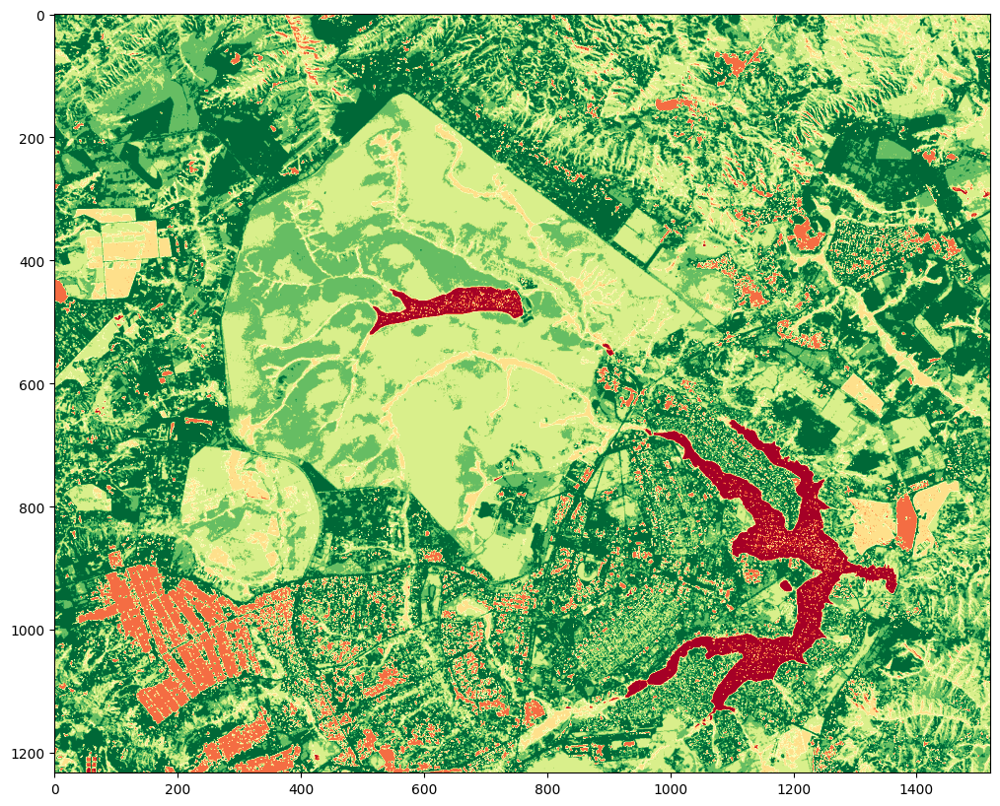

In [47]:
plt.figure(figsize=(20,10))
plt.imshow(c, cmap='RdYlGn')

In [48]:
# Salvar resultado
with rio.open('mlp.tif', 'w', **meta) as src:
  src.write(c,1)

## Treinando modelo  Análise Discriminante Linear de Fisher

In [67]:
# Criar uma instância do classificador fisher
classes_fld = create_training_classes(img,gt)

# criando modelo
fld = linear_discriminant(classes_fld)

# Treinar modelo
fld_img = fld.transform(img)

ImageView object:
  Display bands       :  (0, 1, 2)
  Interpolation       :  <default>
  RGB data limits     :
    R: [-11.549488778124283, 12.9287673720026]
    G: [-8.204832374363047, 7.556846953871449]
    B: [-8.413138708590981, 4.901520139304698]

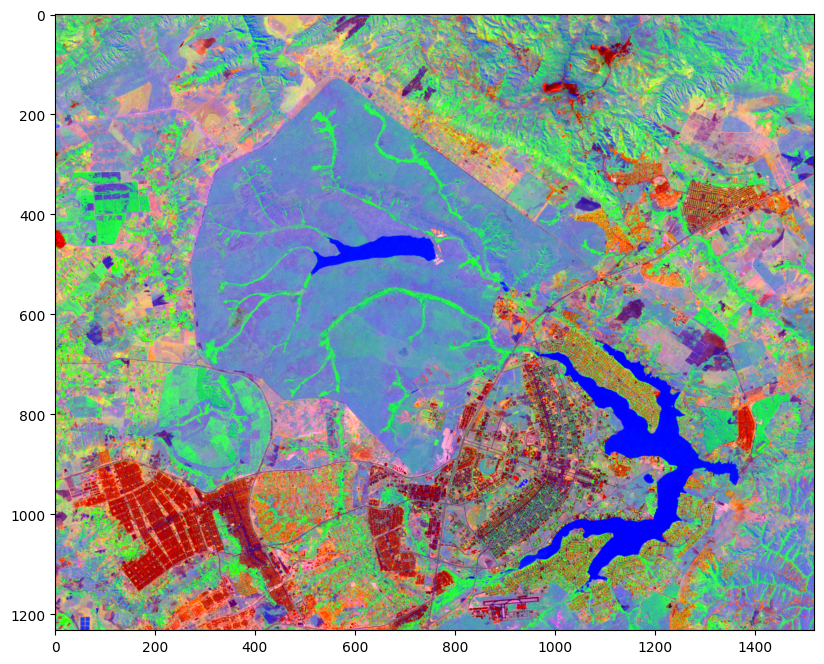

In [68]:
imshow(fld_img, (0,1,2), stretch=(0.02,0.98), figsize=(12,8))

In [69]:
fld_img.shape

(1233, 1520, 5)

In [70]:
# Criando modelo MLP
# Criando as classes de treinamento com a imagem fld_img e os rótulos gt
classes_mlp_fld = create_training_classes(fld_img, gt)

# Obtendo o número de características de entrada
inputs_fld = fld_img.shape[2]

# Obtendo o número de classes de saída
outputs_fld = len(classes_mlp_fld)

# Criando um objeto PerceptronClassifier com a estrutura da MLP
p_fld = PerceptronClassifier([inputs_fld, 20, 10, outputs_fld])

# Treinando a MLP com as classes de treinamento
p_fld.train(classes_mlp_fld, 20, clip=0., accuracy=100, batch=1, momentum=0.3, rate=0.5)

# Classificando a imagem fld_img com o modelo MLP treinado
c_fld = p_fld.classify(fld_img)

Iter     0: Accuracy = 52.50% E = 35.162285
Iter     1: Accuracy = 28.33% E = 43.412993
Iter     2: Accuracy = 20.00% E = 44.859795
Iter     3: Accuracy = 15.00% E = 45.595408
Iter     4: Accuracy = 10.83% E = 45.872902
Iter     5: Accuracy = 10.00% E = 45.853900
Iter     6: Accuracy = 10.83% E = 45.597327
Iter     7: Accuracy = 11.67% E = 44.942292
Iter     8: Accuracy = 15.83% E = 43.550879
Iter     9: Accuracy = 21.67% E = 41.122923
Iter    10: Accuracy = 30.83% E = 37.759308
Iter    11: Accuracy = 40.83% E = 34.131309
Iter    12: Accuracy = 46.67% E = 31.016919
Iter    13: Accuracy = 50.00% E = 28.707661
Iter    14: Accuracy = 55.00% E = 26.955464
Iter    15: Accuracy = 57.50% E = 25.427809
Iter    16: Accuracy = 59.17% E = 24.010930
Iter    17: Accuracy = 62.50% E = 22.690968
Iter    18: Accuracy = 63.33% E = 21.449862
Iter    19: Accuracy = 66.67% E = 20.274358
Iter    20: Accuracy = 67.50% E = 19.203004
Iter    21: Accuracy = 68.33% E = 18.276649
Iter    22: Accuracy = 70.00% E 

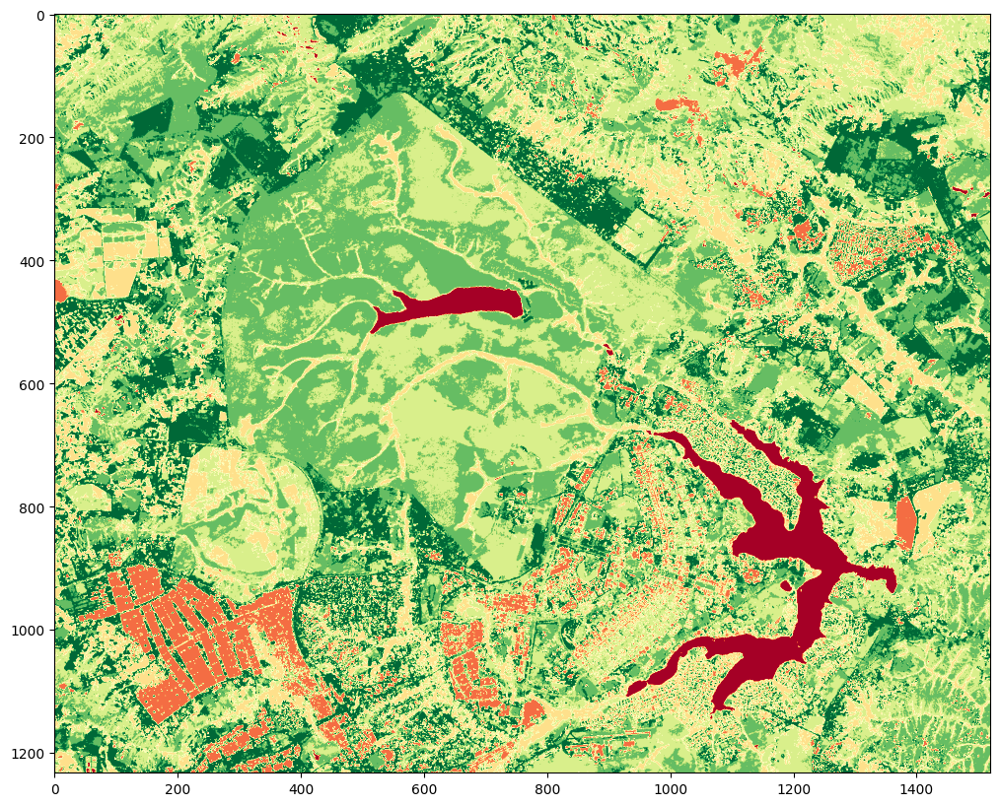

In [72]:
plt.figure(figsize=(20,10))
plt.imshow(c_fld, cmap='RdYlGn')

In [73]:
# Salvar resultado MLP FLD
with rio.open('mlp_fld.tif', 'w', **meta) as src:
  src.write(c_fld,1)

In [74]:
meta.update({'count':5})

In [75]:
fld_img_r = reshape_as_raster(fld_img)

In [76]:
# Salvar resultado FLD
with rio.open('fld.tif', 'w', **meta) as src:
  src.write(fld_img_r)

## Treinando modelo  KNN

In [78]:
# Lendo classes
with rio.open('/content/roi.tif') as src2:
  roi = src2.read(1)

In [79]:
# Criando conjunto de treino
X = img[roi > 0]
y  = roi[roi > 0]

In [81]:
# Dividindo conjunto em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y.ravel(), test_size = 0.95)

In [82]:
# Instanciando o classificador
knn = KNeighborsClassifier(n_neighbors=10, n_jobs=-1)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_jobs=-1, n_neighbors=10)

In [83]:
# Criando matriz com bandas em colunas
img2d = img.reshape(img.shape[0]*img.shape[1], img.shape[2])

# Rodando predição
pred_knn = knn.predict(img2d)

# Retornando para o formato original
pred_knn_final = pred_knn.reshape(img[:,:,0].shape)

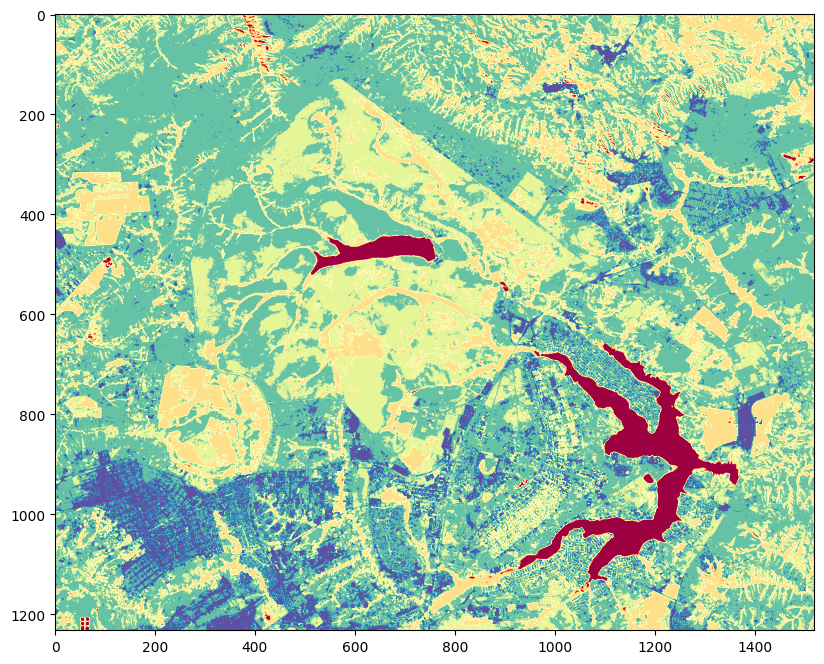

In [84]:
plt.figure(figsize=(12,8))
plt.imshow(pred_knn_final, cmap='Spectral')

In [85]:
# Classification report
pred = knn.predict(X_test)
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        87
           2       0.00      0.00      0.00       114
           3       0.69      1.00      0.81       149
           4       1.00      0.50      0.67       137
           5       0.59      1.00      0.74        99
           6       0.72      0.94      0.81       146

    accuracy                           0.74       732
   macro avg       0.67      0.74      0.67       732
weighted avg       0.67      0.74      0.67       732



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [86]:
accuracy_score(y_test, pred)

0.7390710382513661

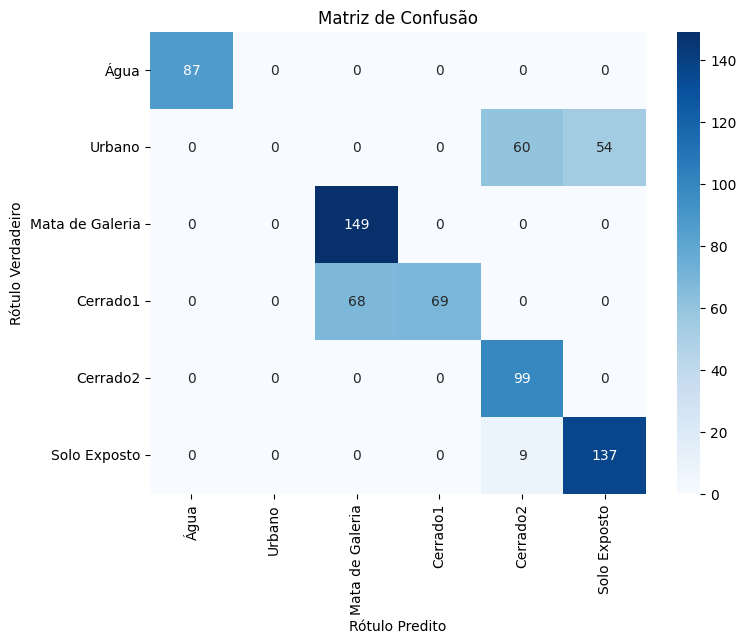

In [90]:
# Definindo as classes
classes = ['Água', 'Urbano', 'Mata de Galeria', 'Cerrado1', 'Cerrado2', 'Solo Exposto']

cm = confusion_matrix(y_test, pred)

# Criando uma visualização da matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)
plt.xlabel('Rótulo Predito')
plt.ylabel('Rótulo Verdadeiro')
plt.title('Matriz de Confusão')
plt.show()

## Random Forest

In [93]:
# Instanciando modelo random forest
rf = RandomForestClassifier(n_estimators= 500, max_depth=1000, n_jobs=-1, oob_score=True)

rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=1000, n_estimators=500, n_jobs=-1,
                       oob_score=True)

In [94]:
print("Score", rf.oob_score_ * 100)

Score 97.36842105263158


In [95]:
rf.feature_importances_

array([0.13354099, 0.18211493, 0.21770389, 0.11806688, 0.14769953,
       0.20087377])

In [96]:
# Rodando predição
pred_rf = rf.predict(img2d)

# Retornando para o formato original
pred_rf_final = pred_rf.reshape(img[:,:,0].shape)

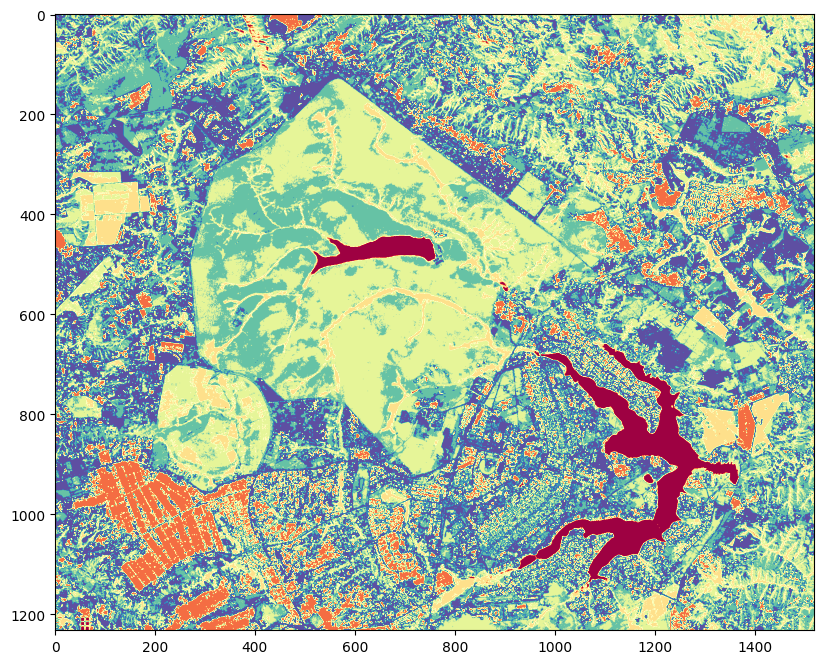

In [97]:
# Visualizando
plt.figure(figsize=(12,8))
plt.imshow(pred_rf_final, cmap='Spectral')

In [98]:
pred = rf.predict(X_test)
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        87
           2       1.00      0.96      0.98       114
           3       1.00      1.00      1.00       149
           4       1.00      1.00      1.00       137
           5       1.00      1.00      1.00        99
           6       0.97      1.00      0.99       146

    accuracy                           0.99       732
   macro avg       1.00      0.99      0.99       732
weighted avg       0.99      0.99      0.99       732



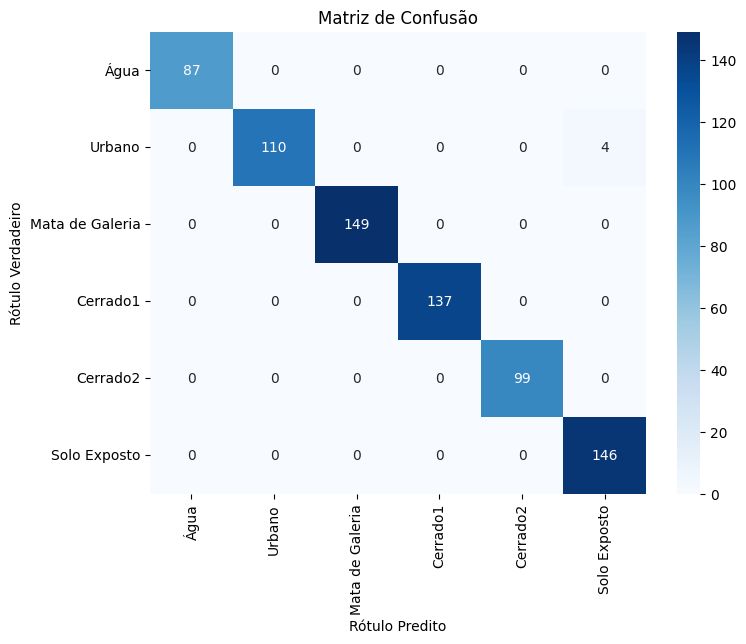

In [99]:
# Definindo as classes
classes = ['Água', 'Urbano', 'Mata de Galeria', 'Cerrado1', 'Cerrado2', 'Solo Exposto']

cm = confusion_matrix(y_test, pred)

# Criando uma visualização da matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)
plt.xlabel('Rótulo Predito')
plt.ylabel('Rótulo Verdadeiro')
plt.title('Matriz de Confusão')
plt.show()

In [100]:
# Tunning de Hiperparâmetros
depth = [1,5,10,15,25,50,100,200,30,400,500]
accu = []

for i in depth:
  rf2 = RandomForestClassifier(n_estimators= i, max_depth=1000, n_jobs=-1)
  rf2.fit(X_train, y_train)
  pred3 = rf2.predict(X_test)
  accu.append(accuracy_score(y_test, pred3))
  print('Acurácia para árvores = {} é: {}'.format(i, accuracy_score(y_test, pred3)))

Acurácia para árvores = 1 é: 0.8306010928961749
Acurácia para árvores = 5 é: 0.9931693989071039
Acurácia para árvores = 10 é: 0.9972677595628415
Acurácia para árvores = 15 é: 0.9918032786885246
Acurácia para árvores = 25 é: 0.9877049180327869
Acurácia para árvores = 50 é: 0.9863387978142076
Acurácia para árvores = 100 é: 0.994535519125683
Acurácia para árvores = 200 é: 0.9972677595628415
Acurácia para árvores = 30 é: 0.9836065573770492
Acurácia para árvores = 400 é: 0.994535519125683
Acurácia para árvores = 500 é: 0.9931693989071039


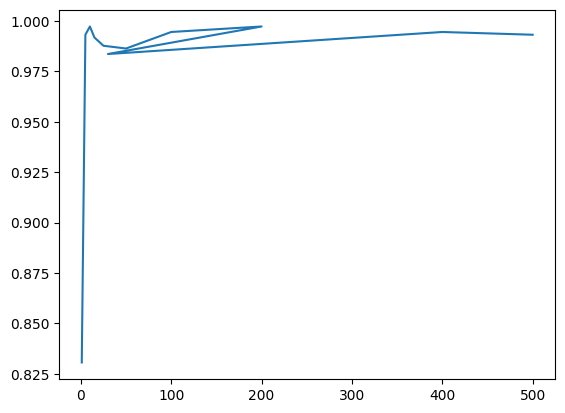

In [102]:
plt.plot(depth, accu)
plt.show()

## SVM

In [103]:
# Instanciando modelo Suporte Vector Machine
svm = SVC()

svm.fit(X_train, y_train)

SVC()

In [104]:
# Rodando predição
pred_svm = svm.predict(img2d)

# Retornando para o formato original
pred_svm_final = pred_svm.reshape(img[:,:,0].shape)

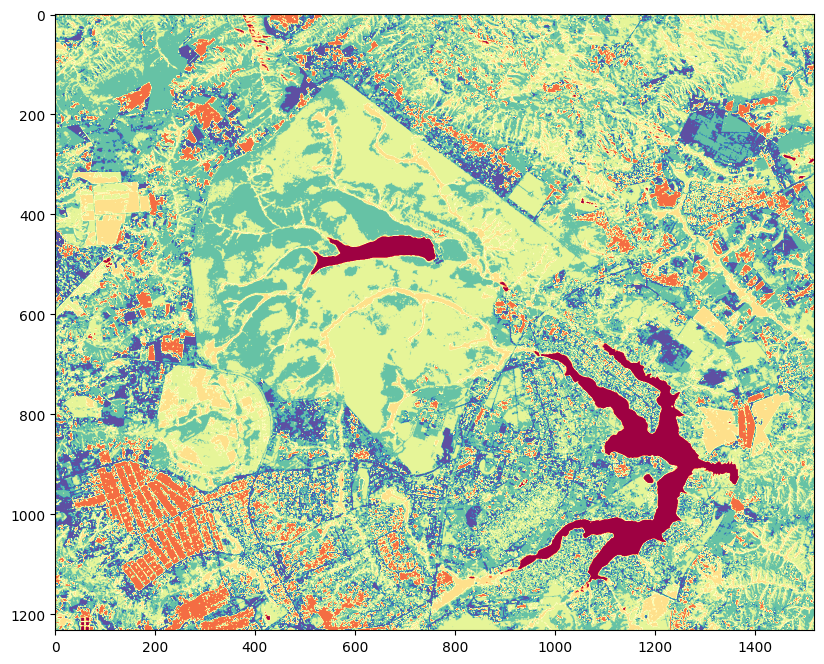

In [105]:
# Visualizando
plt.figure(figsize=(12,8))
plt.imshow(pred_svm_final, cmap='Spectral')

In [106]:
pred = svm.predict(X_test)
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        87
           2       0.98      0.95      0.96       114
           3       1.00      1.00      1.00       149
           4       1.00      1.00      1.00       137
           5       1.00      1.00      1.00        99
           6       0.96      0.99      0.97       146

    accuracy                           0.99       732
   macro avg       0.99      0.99      0.99       732
weighted avg       0.99      0.99      0.99       732



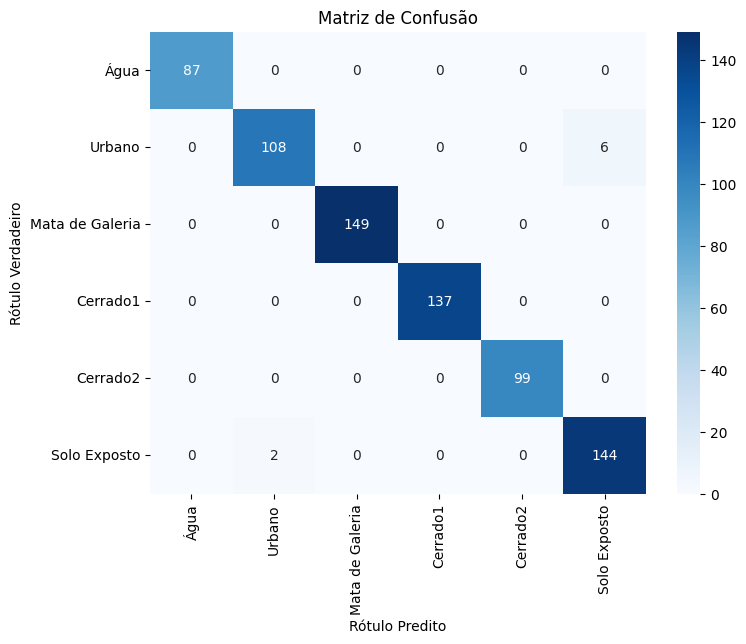

In [107]:
# Definindo as classes
classes = ['Água', 'Urbano', 'Mata de Galeria', 'Cerrado1', 'Cerrado2', 'Solo Exposto']

cm = confusion_matrix(y_test, pred)

# Criando uma visualização da matriz de confusão
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)
plt.xlabel('Rótulo Predito')
plt.ylabel('Rótulo Verdadeiro')
plt.title('Matriz de Confusão')
plt.show()